# **สร้าง mask ของ มะม่วง**

## ดึงรูปจาก folder

In [34]:
import random
import numpy as np
import matplotlib.pyplot as plt
import cv2
from collections import defaultdict
from pathlib import Path
from PIL import Image

PROJECT_ROOT = Path.cwd().parent
DATAPATH = PROJECT_ROOT / "data" / "jpg"
SAMPLES_PER_GRADE = 10
RANDOM_SEED = 42


print(DATAPATH)
print(DATAPATH.exists())
DATAPATH.mkdir(parents=True, exist_ok=True)

c:\Users\noppa\OneDrive\Desktop\mango\data\jpg
True


In [35]:
jpg_img = list(DATAPATH.rglob("*.jpg"))
jpg_img

[WindowsPath('c:/Users/noppa/OneDrive/Desktop/mango/data/jpg/NDM_M1/NDM_M1 (1).jpg'),
 WindowsPath('c:/Users/noppa/OneDrive/Desktop/mango/data/jpg/NDM_M1/NDM_M1 (10).jpg'),
 WindowsPath('c:/Users/noppa/OneDrive/Desktop/mango/data/jpg/NDM_M1/NDM_M1 (100).jpg'),
 WindowsPath('c:/Users/noppa/OneDrive/Desktop/mango/data/jpg/NDM_M1/NDM_M1 (101).jpg'),
 WindowsPath('c:/Users/noppa/OneDrive/Desktop/mango/data/jpg/NDM_M1/NDM_M1 (102).jpg'),
 WindowsPath('c:/Users/noppa/OneDrive/Desktop/mango/data/jpg/NDM_M1/NDM_M1 (103).jpg'),
 WindowsPath('c:/Users/noppa/OneDrive/Desktop/mango/data/jpg/NDM_M1/NDM_M1 (104).jpg'),
 WindowsPath('c:/Users/noppa/OneDrive/Desktop/mango/data/jpg/NDM_M1/NDM_M1 (105).jpg'),
 WindowsPath('c:/Users/noppa/OneDrive/Desktop/mango/data/jpg/NDM_M1/NDM_M1 (106).jpg'),
 WindowsPath('c:/Users/noppa/OneDrive/Desktop/mango/data/jpg/NDM_M1/NDM_M1 (107).jpg'),
 WindowsPath('c:/Users/noppa/OneDrive/Desktop/mango/data/jpg/NDM_M1/NDM_M1 (108).jpg'),
 WindowsPath('c:/Users/noppa/OneDri

## อ่านรูปเป็น RGB

In [36]:
images_by_grade = defaultdict(list)
for image_path in jpg_img:
    images_by_grade[image_path.parent.name].append(image_path)

In [37]:
# สุ่มรูปโดยไม่ซ้ำกันเกรดละ 10 รูป
rng = random.Random(RANDOM_SEED)
sampled_jpg = {}
for grade in sorted(images_by_grade):
    grade_images = sorted(images_by_grade[grade])
    if len(grade_images) < SAMPLES_PER_GRADE:
        raise ValueError(
            f"เกรด {grade} มีรูปเพียง {len(grade_images)} รูป "
            f"ไม่ถึง {SAMPLES_PER_GRADE} รูป"
        )
    sampled_jpg[grade] = rng.sample(grade_images, SAMPLES_PER_GRADE)

for grade, image_paths in sampled_jpg.items():
    print(f"{grade}: {len(image_paths)} รูป")

sampled_jpg

NDM_M1: 10 รูป
NDM_M2: 10 รูป
NDM_M3: 10 รูป


{'NDM_M1': [WindowsPath('c:/Users/noppa/OneDrive/Desktop/mango/data/jpg/NDM_M1/NDM_M1 (26).jpg'),
  WindowsPath('c:/Users/noppa/OneDrive/Desktop/mango/data/jpg/NDM_M1/NDM_M1 (124).jpg'),
  WindowsPath('c:/Users/noppa/OneDrive/Desktop/mango/data/jpg/NDM_M1/NDM_M1 (104).jpg'),
  WindowsPath('c:/Users/noppa/OneDrive/Desktop/mango/data/jpg/NDM_M1/NDM_M1 (5).jpg'),
  WindowsPath('c:/Users/noppa/OneDrive/Desktop/mango/data/jpg/NDM_M1/NDM_M1 (162).jpg'),
  WindowsPath('c:/Users/noppa/OneDrive/Desktop/mango/data/jpg/NDM_M1/NDM_M1 (155).jpg'),
  WindowsPath('c:/Users/noppa/OneDrive/Desktop/mango/data/jpg/NDM_M1/NDM_M1 (150).jpg'),
  WindowsPath('c:/Users/noppa/OneDrive/Desktop/mango/data/jpg/NDM_M1/NDM_M1 (130).jpg'),
  WindowsPath('c:/Users/noppa/OneDrive/Desktop/mango/data/jpg/NDM_M1/NDM_M1 (49).jpg'),
  WindowsPath('c:/Users/noppa/OneDrive/Desktop/mango/data/jpg/NDM_M1/NDM_M1 (122).jpg')],
 'NDM_M2': [WindowsPath('c:/Users/noppa/OneDrive/Desktop/mango/data/jpg/NDM_M2/NDM_M2 (9).jpg'),
  Wind

## ทดลองแสดงรูป

(1780, 1780)
(1780, 1780)
(1780, 1780)
(1780, 1780)
(1780, 1780)
(1780, 1780)
(1780, 1780)
(1780, 1780)
(1780, 1780)
(1780, 1780)


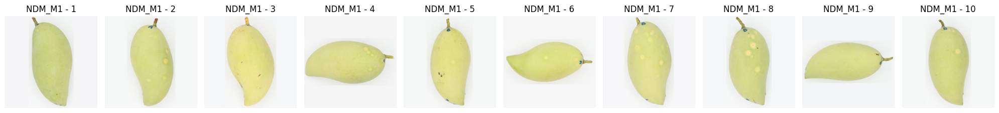

(1780, 1780)
(1780, 1780)
(1780, 1780)
(1780, 1780)
(1780, 1780)
(1780, 1780)
(1780, 1780)
(1780, 1780)
(1780, 1780)
(1780, 1780)


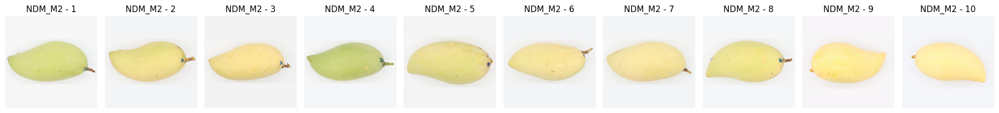

(1780, 1780)
(1780, 1780)
(1780, 1780)
(1780, 1780)
(1780, 1780)
(1780, 1780)
(1780, 1780)
(1780, 1780)
(1780, 1780)
(1780, 1780)


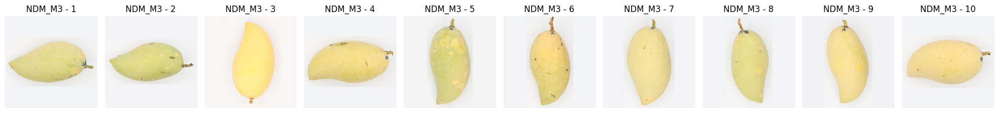

In [38]:
for grade, image_paths in sampled_jpg.items():
    fig, ax = plt.subplots(1, SAMPLES_PER_GRADE, figsize=(20, 5))
    for i, image_path in enumerate(image_paths):
        img = Image.open(image_path)
        print(img.size)
        ax[i].imshow(img)
        ax[i].axis("off")
        ax[i].set_title(f"{grade} - {i+1}")


    plt.tight_layout()
    plt.show()

## แสดง HSV

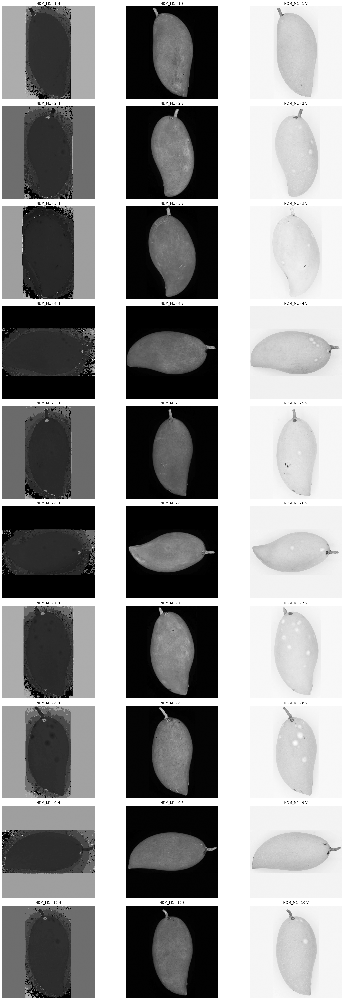

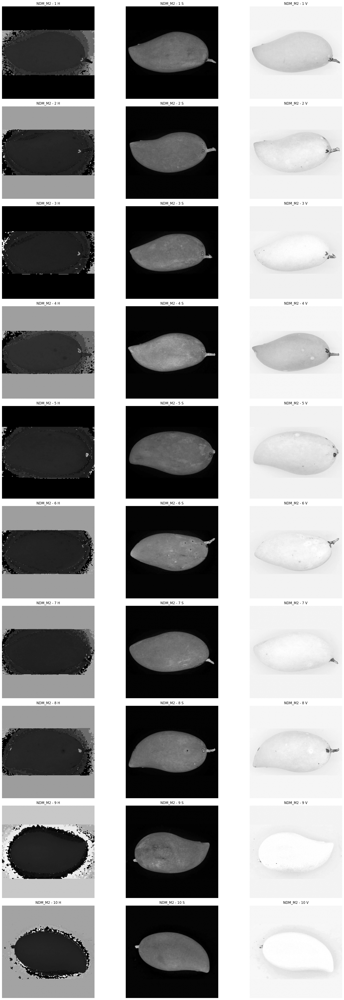

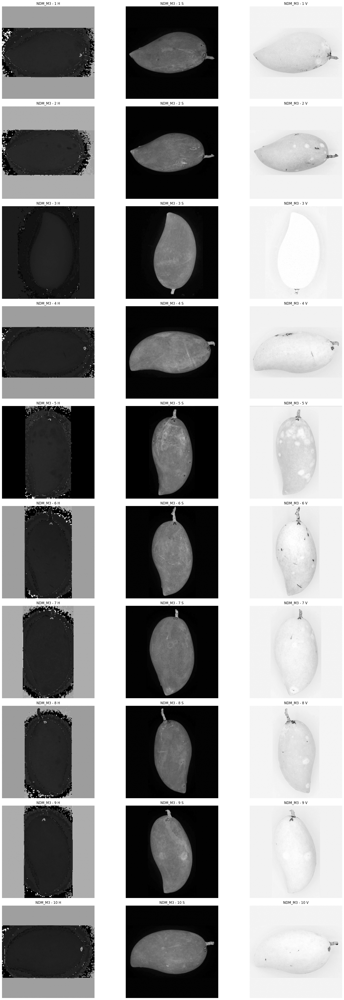

In [39]:
for grade, image_paths in sampled_jpg.items():
    total_imgs = len(image_paths)
    fig, ax = plt.subplots(nrows=total_imgs, ncols=3, figsize=(20, 5 * total_imgs))
    for i, image_path in enumerate(image_paths):
        img = plt.imread(image_path)
        img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        h,s,v = cv2.split(img_hsv)
        for j, channel in enumerate([h, s, v]):
            ax[i][j].imshow(channel, cmap='gray')
            ax[i][j].axis("off")
            ax[i][j].set_title(f"{grade} - {i+1} {'HSV'[j]}")


    plt.tight_layout()
    plt.show()

## แสดง Histogram ของแต่ละรูป

C:\Users\noppa\AppData\Local\Temp\ipykernel_11320\70326367.py:11: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.10; the parameter will become keyword-only in 3.12.
  ax[i][j].hist(channel.ravel(),256,(min_channel,max_channel), color='b')


NDM_M1 - 1 H, Max: 177, Min: 0, Mean: 80.86, Std: 42.47
NDM_M1 - 1 S, Max: 201, Min: 0, Mean: 29.35, Std: 40.68
NDM_M1 - 1 V, Max: 255, Min: 21, Mean: 232.88, Std: 19.78
NDM_M1 - 2 H, Max: 173, Min: 0, Mean: 54.49, Std: 22.93
NDM_M1 - 2 S, Max: 186, Min: 0, Mean: 29.16, Std: 41.04
NDM_M1 - 2 V, Max: 255, Min: 7, Mean: 235.27, Std: 17.40
NDM_M1 - 3 H, Max: 177, Min: 0, Mean: 64.37, Std: 42.83
NDM_M1 - 3 S, Max: 237, Min: 0, Mean: 33.29, Std: 44.23
NDM_M1 - 3 V, Max: 255, Min: 18, Mean: 240.01, Std: 11.54
NDM_M1 - 4 H, Max: 173, Min: 0, Mean: 16.36, Std: 19.72
NDM_M1 - 4 S, Max: 232, Min: 0, Mean: 28.64, Std: 41.66
NDM_M1 - 4 V, Max: 255, Min: 77, Mean: 234.08, Std: 15.16
NDM_M1 - 5 H, Max: 178, Min: 0, Mean: 55.52, Std: 23.36
NDM_M1 - 5 S, Max: 255, Min: 0, Mean: 28.03, Std: 41.29
NDM_M1 - 5 V, Max: 255, Min: 19, Mean: 237.99, Std: 14.47
NDM_M1 - 6 H, Max: 177, Min: 0, Mean: 15.49, Std: 19.61
NDM_M1 - 6 S, Max: 204, Min: 0, Mean: 26.32, Std: 43.26
NDM_M1 - 6 V, Max: 255, Min: 74, Mean: 

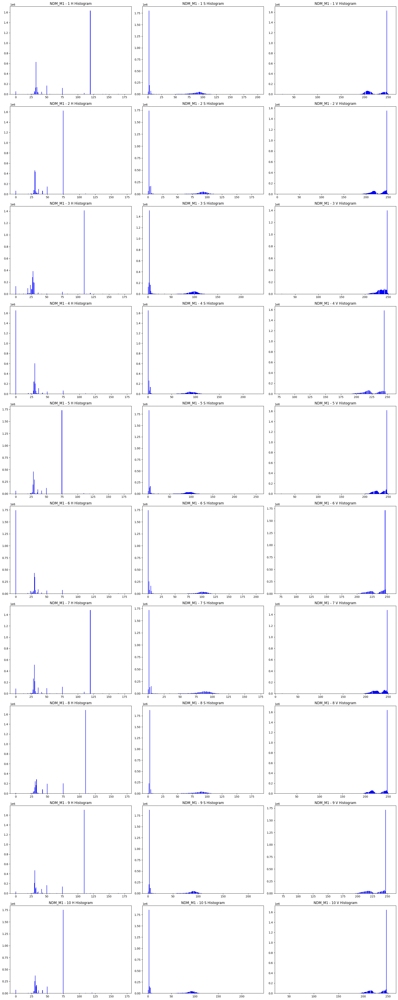

NDM_M2 - 1 H, Max: 179, Min: 0, Mean: 19.00, Std: 24.65
NDM_M2 - 1 S, Max: 238, Min: 0, Mean: 27.12, Std: 42.20
NDM_M2 - 1 V, Max: 255, Min: 42, Mean: 236.59, Std: 14.69
NDM_M2 - 2 H, Max: 177, Min: 0, Mean: 68.16, Std: 44.04
NDM_M2 - 2 S, Max: 255, Min: 0, Mean: 29.27, Std: 42.76
NDM_M2 - 2 V, Max: 255, Min: 68, Mean: 241.31, Std: 8.65
NDM_M2 - 3 H, Max: 177, Min: 0, Mean: 11.24, Std: 19.30
NDM_M2 - 3 S, Max: 230, Min: 0, Mean: 25.15, Std: 41.96
NDM_M2 - 3 V, Max: 255, Min: 37, Mean: 241.71, Std: 8.26
NDM_M2 - 4 H, Max: 177, Min: 0, Mean: 76.29, Std: 38.66
NDM_M2 - 4 S, Max: 186, Min: 0, Mean: 26.90, Std: 41.50
NDM_M2 - 4 V, Max: 255, Min: 48, Mean: 235.25, Std: 19.66
NDM_M2 - 5 H, Max: 178, Min: 0, Mean: 13.93, Std: 16.85
NDM_M2 - 5 S, Max: 255, Min: 0, Mean: 31.42, Std: 43.70
NDM_M2 - 5 V, Max: 255, Min: 47, Mean: 237.42, Std: 10.35
NDM_M2 - 6 H, Max: 178, Min: 0, Mean: 71.17, Std: 44.06
NDM_M2 - 6 S, Max: 185, Min: 0, Mean: 25.22, Std: 37.31
NDM_M2 - 6 V, Max: 255, Min: 66, Mean: 2

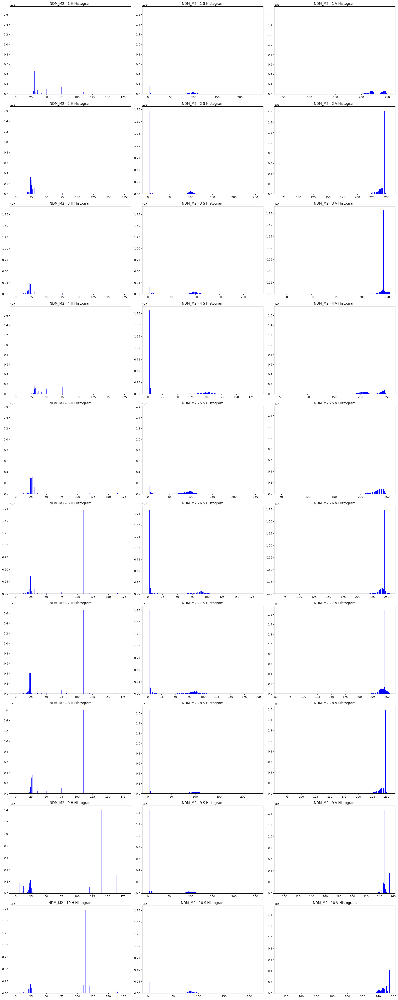

NDM_M3 - 1 H, Max: 177, Min: 0, Mean: 66.90, Std: 44.22
NDM_M3 - 1 S, Max: 255, Min: 0, Mean: 26.50, Std: 39.11
NDM_M3 - 1 V, Max: 255, Min: 32, Mean: 236.86, Std: 12.92
NDM_M3 - 2 H, Max: 177, Min: 0, Mean: 78.46, Std: 47.81
NDM_M3 - 2 S, Max: 245, Min: 0, Mean: 25.16, Std: 40.52
NDM_M3 - 2 V, Max: 255, Min: 57, Mean: 236.19, Std: 14.83
NDM_M3 - 3 H, Max: 179, Min: 0, Mean: 18.93, Std: 6.86
NDM_M3 - 3 S, Max: 231, Min: 0, Mean: 35.52, Std: 47.78
NDM_M3 - 3 V, Max: 255, Min: 81, Mean: 248.88, Std: 4.07
NDM_M3 - 4 H, Max: 178, Min: 0, Mean: 62.57, Std: 44.35
NDM_M3 - 4 S, Max: 225, Min: 0, Mean: 36.07, Std: 47.95
NDM_M3 - 4 V, Max: 255, Min: 67, Mean: 240.20, Std: 9.05
NDM_M3 - 5 H, Max: 177, Min: 0, Mean: 13.23, Std: 18.04
NDM_M3 - 5 S, Max: 213, Min: 0, Mean: 28.34, Std: 43.75
NDM_M3 - 5 V, Max: 255, Min: 17, Mean: 234.98, Std: 13.31
NDM_M3 - 6 H, Max: 178, Min: 0, Mean: 66.52, Std: 45.49
NDM_M3 - 6 S, Max: 241, Min: 0, Mean: 32.57, Std: 48.61
NDM_M3 - 6 V, Max: 255, Min: 54, Mean: 23

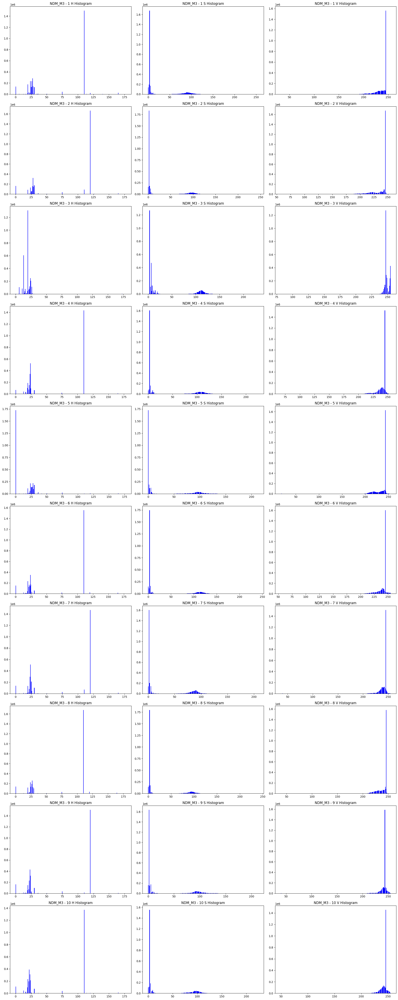

In [40]:
for grade, image_paths in sampled_jpg.items():
    total_imgs = len(image_paths)
    fig, ax = plt.subplots(nrows=total_imgs, ncols=3, figsize=(20, 5 * total_imgs))
    for i, image_path in enumerate(image_paths):
        img = plt.imread(image_path)
        img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        h,s,v = cv2.split(img_hsv)
        for j, channel in enumerate([h, s, v]):
            max_channel = np.max(channel)
            min_channel = np.min(channel)
            ax[i][j].hist(channel.ravel(),256,(min_channel,max_channel), color='b')
            # ax[i][j].axis("off")
            ax[i][j].set_title(f"{grade} - {i+1} {'HSV'[j]} Histogram")
            print(f"{grade} - {i+1} {'HSV'[j]}, Max: {max_channel}, Min: {min_channel}, Mean: {np.mean(channel):.2f}, Std: {np.std(channel):.2f}")


    plt.tight_layout()
    plt.show()

## สร้าง Mask

In [41]:
MASK_PATH = PROJECT_ROOT / "data" / "fruit_masks"
MASK_PATH.mkdir(parents=True, exist_ok=True)
LOWER_S = 20
UPPER_S = 255
KERNEL = np.ones((3, 3))

In [42]:
def create_fruit_mask(image_path, lower_s=LOWER_S, upper_s=UPPER_S):
    img = plt.imread(image_path)
    img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    _,s,_ = cv2.split(img_hsv)

    # สร้าง mask โดยใช้ค่า saturation
    mask = cv2.inRange(s, lower_s, upper_s)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, KERNEL)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, KERNEL)

    contours, _ = cv2.findContours(
        mask,
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )

    fruit_mask = np.zeros_like(mask)

    if contours:
        largest_contour = max(contours, key=cv2.contourArea)
        cv2.drawContours(
            fruit_mask,
            [largest_contour],
            -1,
            255,
            cv2.FILLED
        )
        
    return fruit_mask

## ตัวอย่างการสร้าง mask

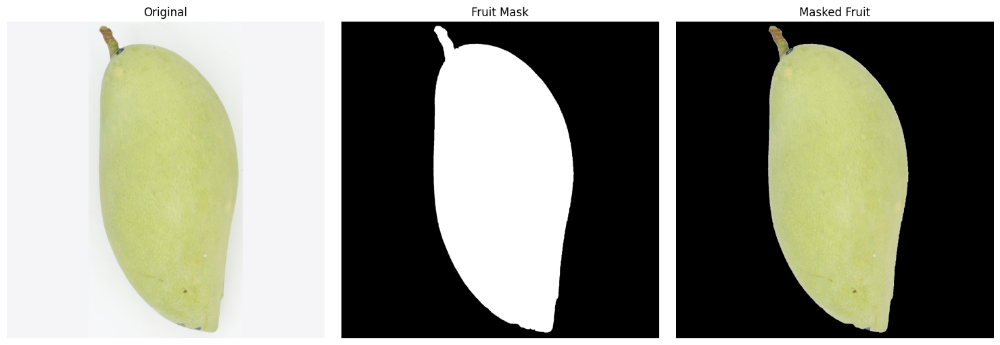

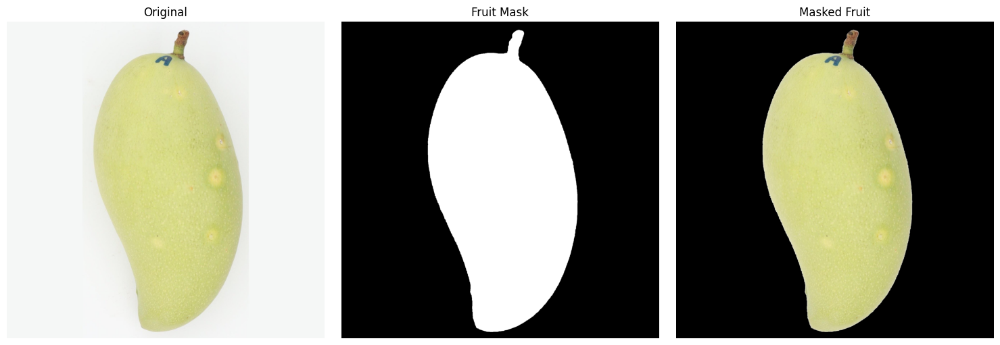

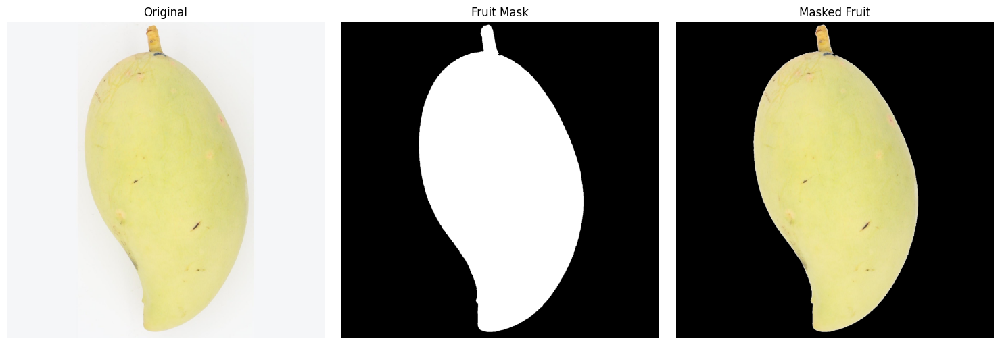

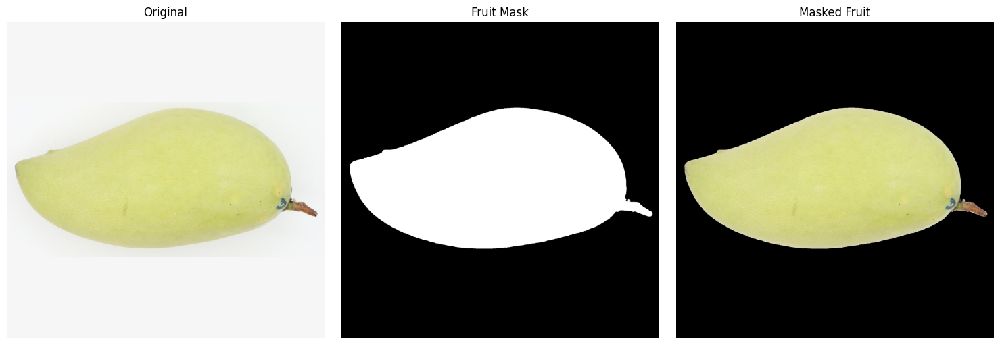

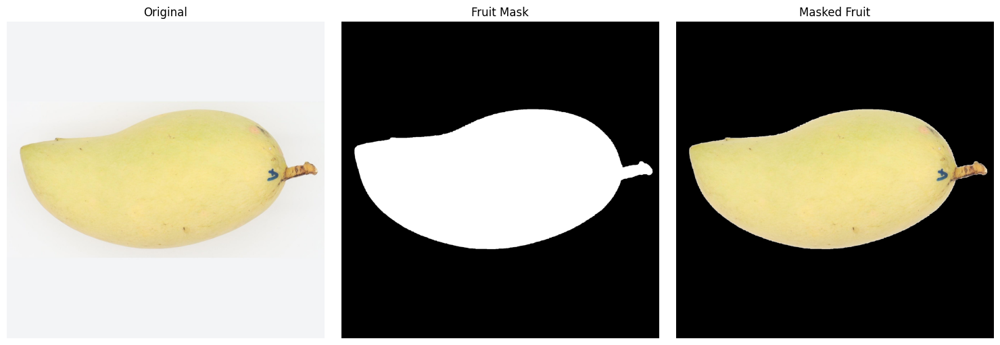

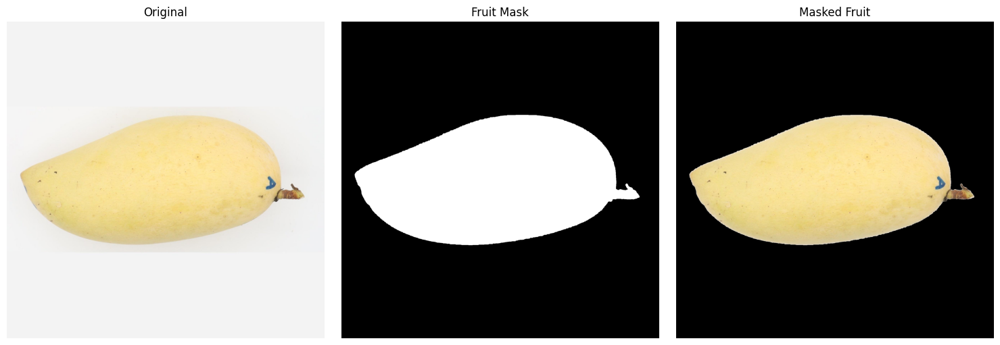

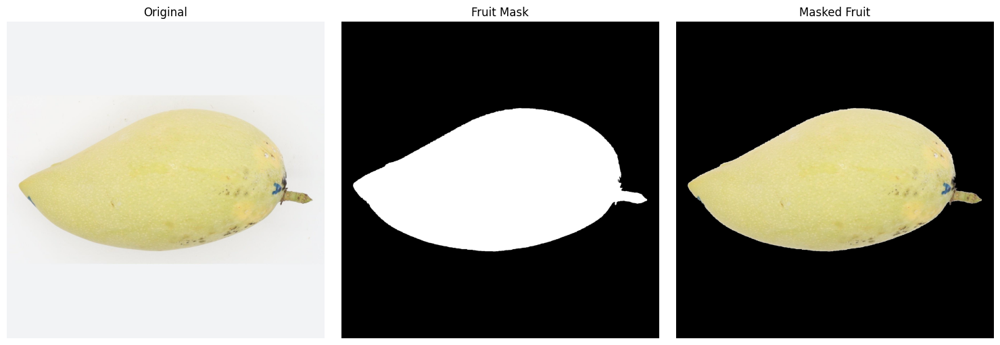

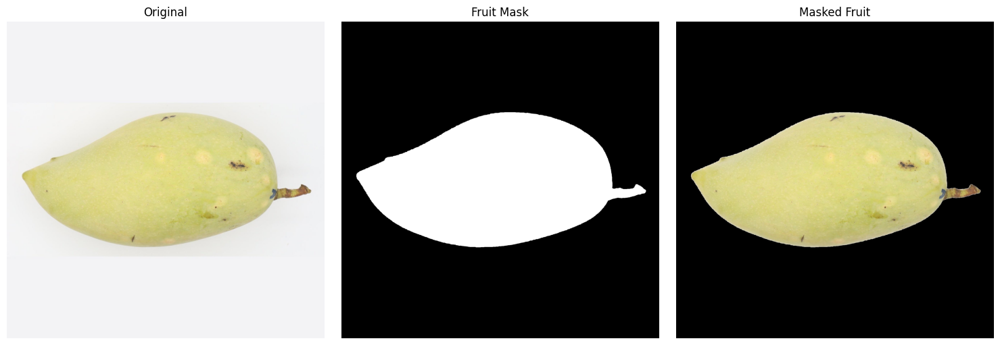

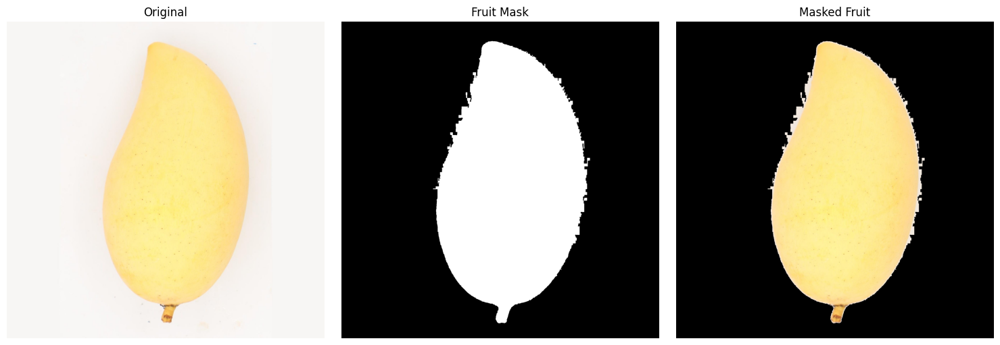

In [43]:
for grade, image_paths in sampled_jpg.items():
    for image_path in image_paths[:3]:
        img = plt.imread(image_path)
        fruit_mask = create_fruit_mask(image_path)

        masked_image = img.copy()
        masked_image[fruit_mask == 0] = 0

        fig, ax = plt.subplots(1, 3, figsize=(15, 5))

        ax[0].imshow(img)
        ax[0].set_title("Original")

        ax[1].imshow(fruit_mask, cmap="gray")
        ax[1].set_title("Fruit Mask")

        ax[2].imshow(masked_image)
        ax[2].set_title("Masked Fruit")

        for axis in ax:
            axis.axis("off")

        plt.tight_layout()
        plt.show()

## เก็บรูป mask ลงโฟลเดอร์

In [44]:
for grade, image_paths in images_by_grade.items():
    grade_dir = MASK_PATH / grade
    grade_dir.mkdir(parents=True, exist_ok=True)
    for image_path in image_paths:
        fruit_mask = create_fruit_mask(image_path)
        new_image_path = grade_dir / f"{image_path.stem}_mask.png"
        cv2.imwrite(str(new_image_path), fruit_mask)